# Designing Annotation Tool using OpenCV: The RoadMap

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['image.cmap'] = 'gray'

## Load the Images

In [2]:
stags = cv2.imread('Media/stags.jpg')
boars = cv2.imread('Media/boar.jpg')
berries = cv2.imread('Media/strawberries.jpg')
fishes = cv2.imread('Media/fishes.jpg')
coins = cv2.imread('Media/coins.png')
boxes = cv2.imread('Media/boxes2.jpg')

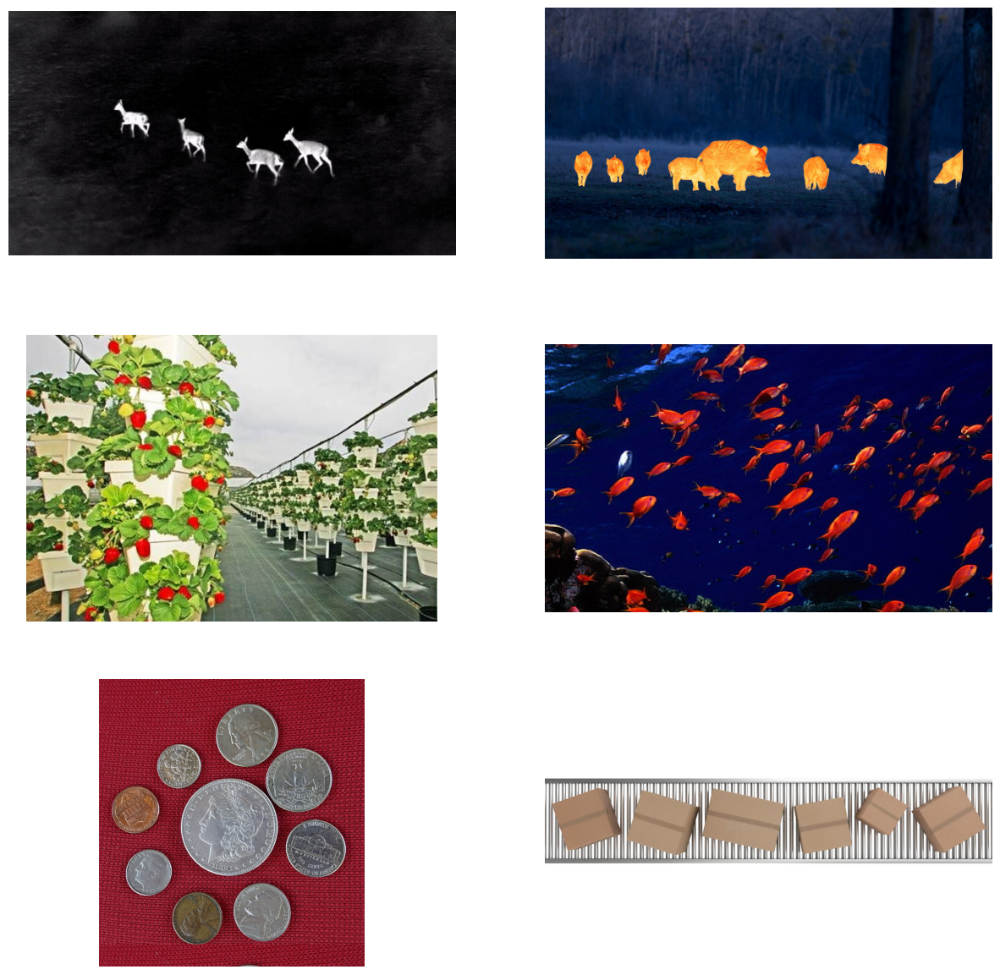

In [3]:
# Display images.
plt.figure(figsize=(15,15))
plt.subplot(3,2,1); plt.imshow(stags[...,::-1]); plt.axis('off');
plt.subplot(3,2,2); plt.imshow(boars[...,::-1]); plt.axis('off');
plt.subplot(3,2,3); plt.imshow(berries[...,::-1]); plt.axis('off');
plt.subplot(3,2,4); plt.imshow(fishes[...,::-1]); plt.axis('off');
plt.subplot(3,2,5); plt.imshow(coins[...,::-1]); plt.axis('off');
plt.subplot(3,2,6); plt.imshow(boxes[...,::-1]); plt.axis('off');

## Select Color Space

In [4]:
def select_colorsp(img, colorsp='gray'):
    """
    Convert colorspace of an image and returns individual channel.
    Args:
        img (ndarray): Image in BGR format.
        colorsp (str) : Colorspace ['gray', 'blue', 'green', 'red', 'hue', 'sat', 'val'], default is 'gray'.
    Returns: (ndarray)
       1-channels image
    """
    # Convert to grayscale.
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Split BGR.
    red, green, blue = cv2.split(img)
    # Convert to HSV.
    im_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    # Split HSV.
    hue, sat, val = cv2.split(im_hsv)
    # Store channels in a dict.
    channels = {'gray':gray, 'red':red, 'green':green, 
                'blue':blue, 'hue':hue, 'sat':sat, 'val':val}
    
    return channels[colorsp]

## Utility Function to Display 1x2 Images

In [5]:
def display(im_left, im_right, name_l='Left', name_r='Right', figsize=(10,7)):
    
    # Flip channels for display if RGB.
    im_l_dis = im_left[...,::-1]  if len(im_left.shape) > 2 else im_left
    im_r_dis = im_right[...,::-1] if len(im_right.shape) > 2 else im_right
    
    plt.figure(figsize=figsize)
    plt.subplot(121); plt.imshow(im_l_dis);
    plt.title(name_l, fontsize = 20); plt.axis(False);
    plt.subplot(122); plt.imshow(im_r_dis);
    plt.title(name_r, fontsize = 20); plt.axis(False);

## Perform Thresholding

In [6]:
def threshold(img, thresh=127, mode='inverse'):
    """
    Perform thresholding.
    Args:
        img (array) : Single channel image for thresholding.
        thresh (int) : Threshold value in the range (0 - 255), 127 by default.
        mode (str) : Thresholding mode. 'direct' = BINARY, 'inverse'= BINARY_INV.
    Returns:
        1-channel thresholded image.
        
    """
    im = img.copy()
    
    if mode == 'direct':
        thresh_mode = cv2.THRESH_BINARY
    else:
        thresh_mode = cv2.THRESH_BINARY_INV
    
    ret, thresh = cv2.threshold(im, thresh, 255, thresh_mode)
        
    return thresh

## Example 1: Infrared Image of Stags

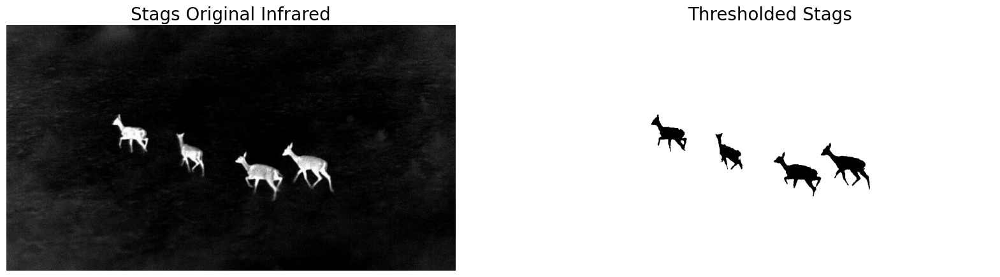

In [7]:
# Select colorspace.
gray_stags = select_colorsp(stags)
# Perform thresholding.
thresh_stags = threshold(gray_stags, thresh=110)
# Display.
display(stags, thresh_stags, 
        name_l='Stags Original Infrared', 
        name_r='Thresholded Stags',
        figsize=(20,14))

As you can see, it is doing a decent job masking the stags.


Let's us perform contour analysis to annotate the stags.

## Contour Analysis

In [8]:
def get_bboxes(img):
    """
    Obtain bounding box around objects using contour analysis.
    Args:
        img (array) : 1 Channel image.
    Returns:
        bboxes (tuple) : Top left and bottom right coordinates (x1, y1, x2, y2) of boundig boxes. 
    """
    contours, hierarchy = cv2.findContours(img, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    # Sort according to the area of contours in descending order.
    sorted_cnt = sorted(contours, key=cv2.contourArea, reverse = True)
    # Remove max area, outermost contour.
    sorted_cnt.remove(sorted_cnt[0])
    bboxes = []
    for cnt in sorted_cnt:
        x,y,w,h = cv2.boundingRect(cnt)
        cnt_area = w * h
        bboxes.append((x, y, x+w, y+h))
    
    return bboxes

## Utility Function to Draw Annotations

In [9]:
def draw_annotations(img, bboxes, thickness=2, color=(0,255,0)):
    """
    Draw bounding boxes around the objects.
    Args:
        img (ndarray): Image array.
        bboxes (tuple) : Bounding box coordinates in the form (x1, y1, x2, y2).
        thickness (int) : Bounding box line thickness, default is 2.
        color (tuple) : RGB color code, default is green.
    
    Returns:
        img (ndarray) : Image with annotations.
    """
    annotations = img.copy()
    for box in bboxes:
        tlc = (box[0], box[1])
        brc = (box[2], box[3])
        cv2.rectangle(annotations, tlc, brc, color, thickness, cv2.LINE_AA)
    
    return annotations

## Draw Annotations

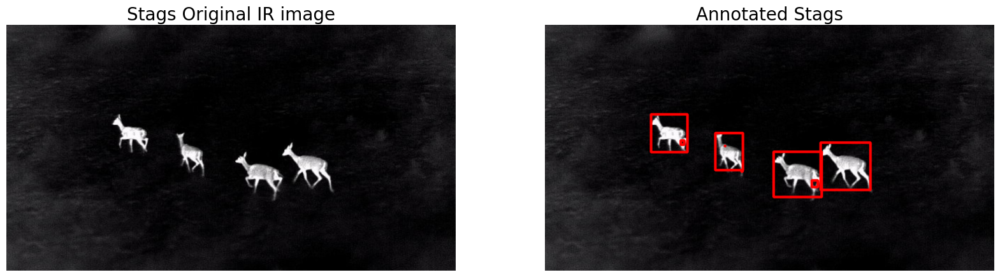

In [10]:
bboxes = get_bboxes(thresh_stags)
ann_stags = draw_annotations(stags, bboxes, thickness=5, color=(0,0,255))

# Display.
display(stags, ann_stags, 
        name_l='Stags Original IR image', 
        name_r='Annotated Stags',
        figsize=(20,14))

## Refining Detections
As we can see, the stags are being detected. However, taking a closer look, there are a few unwanted smaller boxes as well. There are several approaches to solve this. Let's try with the following ways.

1. Perform Morphological Operation.
2. Filter out smaller areas.

### 1. Perform Morphological Operations

In [11]:
def morph_op(img, mode='open', ksize=5, iterations=1):
    """
    Perform morphological operations.
    Args:
        img (array) : Single channel image.
        mode (str) : Mode of morphological operations. Select from ['open', 'close', 'erode', 'dilate']. 
                     Default is 'open'.
        ksize (int) : Kernel size, must be an odd number greater than 0.
        iterations (int) : Number of iterations for morphological operations. Default is 1.
    Returns:
        Image (array).
    """
    im = img.copy()
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(ksize, ksize))
    
    if mode == 'open':
        morphed = cv2.morphologyEx(im, cv2.MORPH_OPEN, kernel)
    elif mode == 'close':
        morphed = cv2.morphologyEx(im, cv2.MORPH_CLOSE, kernel)
    elif mode == 'erode':
        morphed = cv2.erode(im, kernel)
    else:
        morphed = cv2.dilate(im, kernel)
    
    return morphed

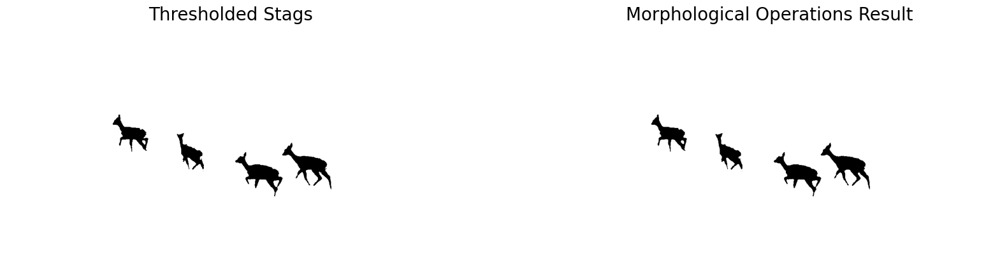

In [12]:
morphed_stags = morph_op(thresh_stags, mode='open', iterations=1)

# Display.
display(thresh_stags, morphed_stags, 
        name_l='Thresholded Stags', 
        name_r='Morphological Operations Result',
       figsize=(20,14))

The results look almost the same. 

**Has it removed the smaller blobs?** 

Let's draw the annotations on the morphed stags to find out.

### Draw Annotations on Morphed Stags

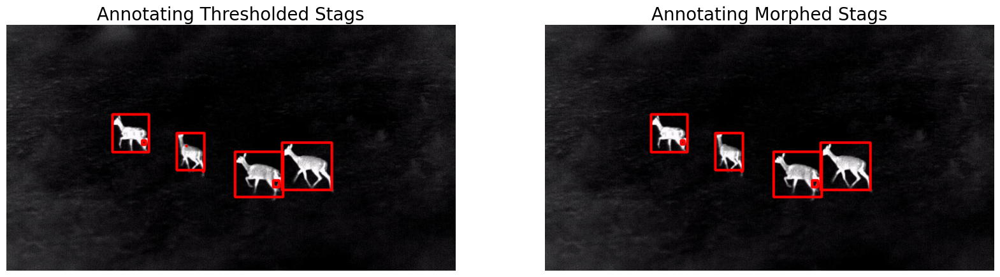

In [13]:
bboxes = get_bboxes(morphed_stags)
ann_morphed_stags = draw_annotations(stags, bboxes, thickness=5, color=(0,0,255))

# Display.
display(ann_stags, ann_morphed_stags, 
        name_l='Annotating Thresholded Stags', 
        name_r='Annotating Morphed Stags',
       figsize=(20,14))

We can see that the improvement is negligible. Only the blob on the second stag (from left) is gone.

It means that we have to increase the kernel size to take care of bigger blobs. You can also play with the number of iterations. However, this will also affect the rest of the image. No matter how optimally we set the parameters, there will be some imperfections always. It would be a tedious task adjusting these values when working with thousands of images.

Morphological operation is useful in removing small scale imperfections, edges, noise etc. This is an important part of the pipeline but it is not sufficient alone.

In annotation, miniscule bounding boxes has no significant contribution unless we are working with small scale obejcts specifically. Let's complete the pipeline by defining a function to filter out these smaller areas.

### 2. Filter out Small Areas
Let's modify the `get_bboxes` function by adding filtering functionality. We are removing the boxes that are 1000 times smaller than the image. You can adjust this value to work with your image.

In [14]:
def get_filtered_bboxes(img, min_area_ratio=0.001):
    """
    Get bounding boxes after filtering smaller boxes.
    
    Args:
        img (array) : Single channel thresholded image.
        min_area_ratio (float) : Minimum permissible area ratio of bounding boxes (box_area/image_area). Default is 0.001.       
    Returns: (tuple)
        Tuple of bounding box coordinates in (x1, y1, x2, y2) format.
    """
    contours, hierarchy = cv2.findContours(img, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    # Sort the contours according to area, larger to smaller.
    sorted_cnt = sorted(contours, key=cv2.contourArea, reverse = True)
    # Remove max area, outermost contour.
    sorted_cnt.remove(sorted_cnt[0])
    # Container to store filtered bboxes.
    bboxes = []
    # Image area.
    im_area = img.shape[0] * img.shape[1]
    for cnt in sorted_cnt:
        x,y,w,h = cv2.boundingRect(cnt)
        cnt_area = w * h
        # Remove very small detections.
        if cnt_area > min_area_ratio * im_area:
            bboxes.append((x, y, x+w, y+h))
    
    return bboxes

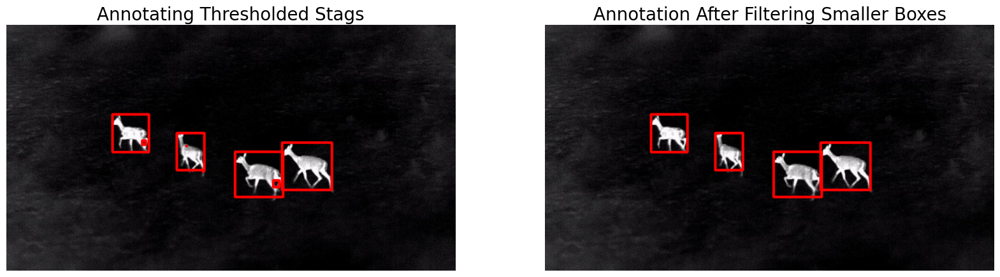

In [15]:
bboxes = get_filtered_bboxes(thresh_stags, min_area_ratio=0.001)
filtered_ann_stags = draw_annotations(stags, bboxes, thickness=5, color=(0,0,255))

# Display.
display(ann_stags, filtered_ann_stags, 
        name_l='Annotating Thresholded Stags', 
        name_r='Annotation After Filtering Smaller Boxes',
       figsize=(20,14))

**We got the desired result!** 

Now, all we need to do is save the annotations in required format. We will discuss different formats of annotation in the end. Let's try on other examples.

## Example 2: Infrared Image of Boars
To recap, following are the steps to be followed.
 - Select colorspace
 - Perform thresholding
 - Perfrom morphological operations
 - Find Contours
 - Filter smaller boxes
 - Draw

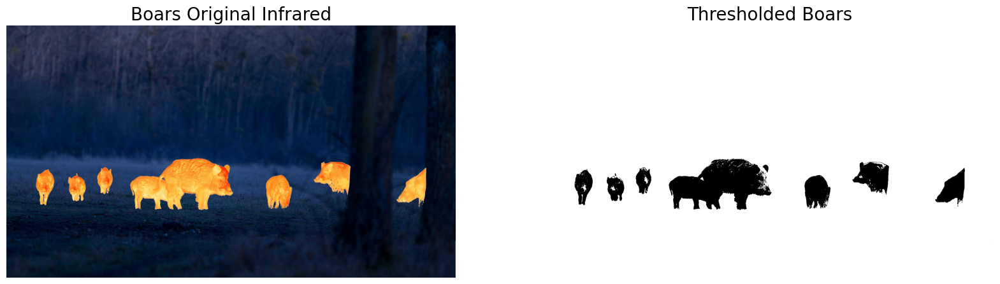

In [16]:
# Select colorspace.
gray_boars = select_colorsp(boars, colorsp='gray')

# Perform thresholding.
thresh_boars = threshold(gray_boars, thresh=140)

# Display.
display(boars, thresh_boars, 
        name_l='Boars Original Infrared', 
        name_r='Thresholded Boars',
        figsize=(20, 14))

We can see that the thresholded image has significantly larger white dots. 

Let's remove them by default operation `open`. I found `kernel_size=13` working perfectly.

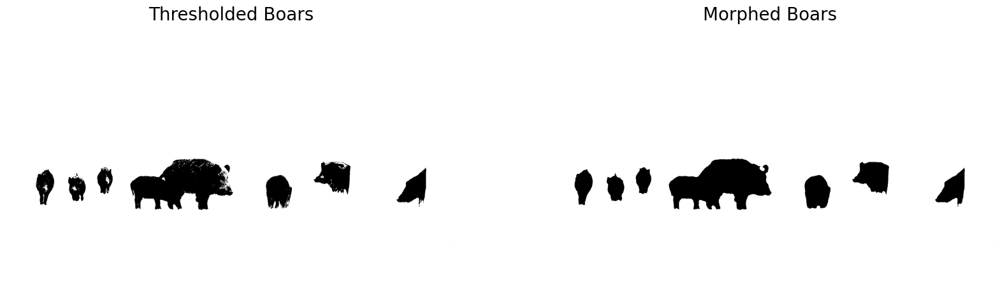

In [17]:
# Perform morphological operations.
morph_boars = morph_op(thresh_boars, mode='open', ksize=13)

display(thresh_boars, morph_boars,
        name_l='Thresholded Boars', 
        name_r='Morphed Boars',
        figsize=(20, 14))

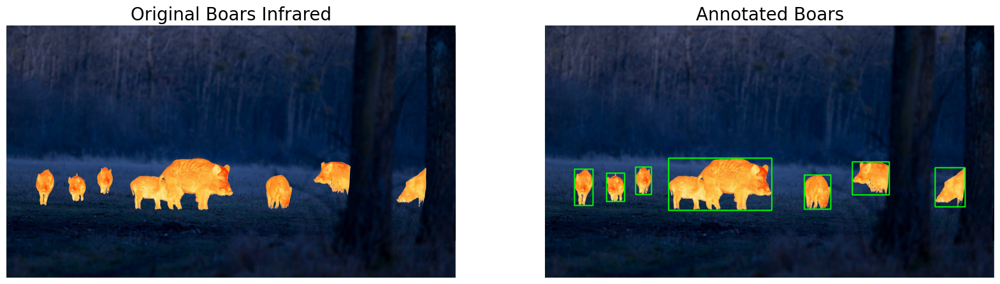

In [18]:
# Find contours and draw annotations.
bboxes = get_filtered_bboxes(morph_boars)
# Draw annotations.
ann_boars = draw_annotations(boars, bboxes, thickness=4)

display(boars, ann_boars,
        name_l='Original Boars Infrared', 
        name_r='Annotated Boars',
        figsize=(20, 14))

## Example 3: Color Segmentation Based Annotation

If your dataset has specific colored objects, then color segmentation is the best way to go. We will use the following images - strawberries and fishes to demonstrate annotation. The objective is to annotate the ripe berries and red school of fishes.

Steps to be followed:
1. Pick a color. We will use HSV colorspace here.
2. Find the color mask.
3. Perform thresholding and morphological operations.
4. Perform contour analysis.
5. Draw annotations.


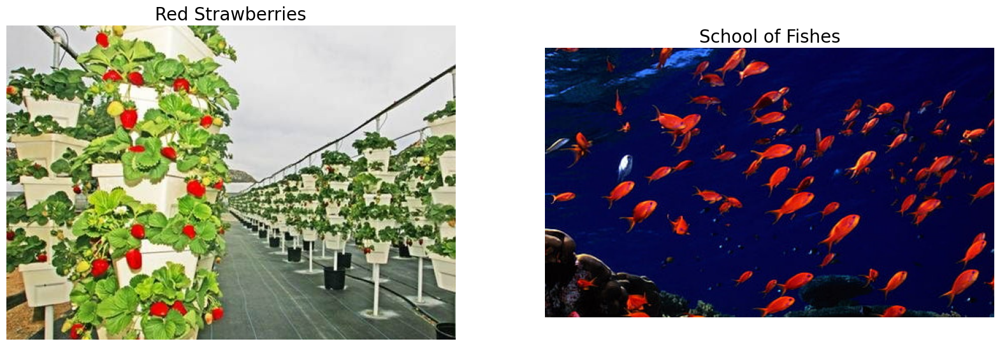

In [19]:
display(berries, fishes,
       name_l='Red Strawberries',
       name_r='School of Fishes',
       figsize=(20,14))

### Function to Generate Color Mask

In [20]:
def get_color_mask(img, lower=[0,0,0], upper=[0,255,255]):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    low = np.array(lower)
    up = np.array(upper)
    mask = cv2.inRange(img_hsv, low, up)
    inv_mask = 255 - mask
    
    return inv_mask

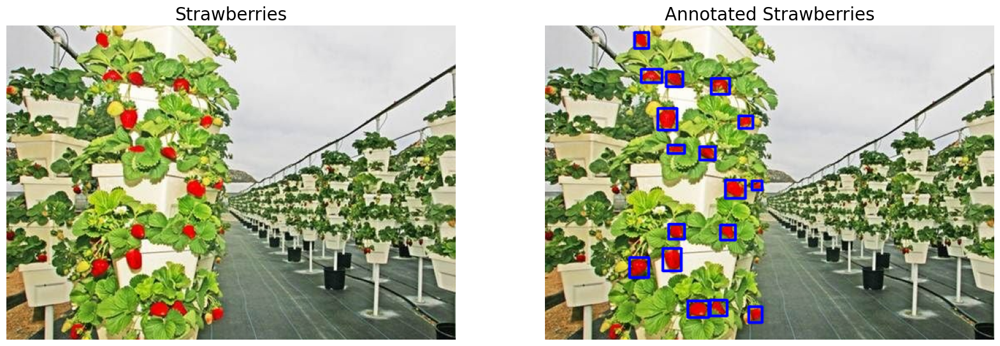

In [21]:
mask_berries = get_color_mask(berries, 
                              lower=[0, 211, 111], 
                              upper=[16, 255,255])

# Morphological operation, default is 'open'.
morphed_berries = morph_op(mask_berries)

# Contour analysis.
bboxes = get_filtered_bboxes(morphed_berries, min_area_ratio=0.0005)
# Draw annotations.
ann_berries = draw_annotations(berries, bboxes, thickness=2, color=(255,0,0))

# Display.
display(berries, ann_berries,
        name_l='Strawberries', 
        name_r='Annotated Strawberries',
        figsize=(20, 14))

### Fishes
Let's try it on the red school of fishes.

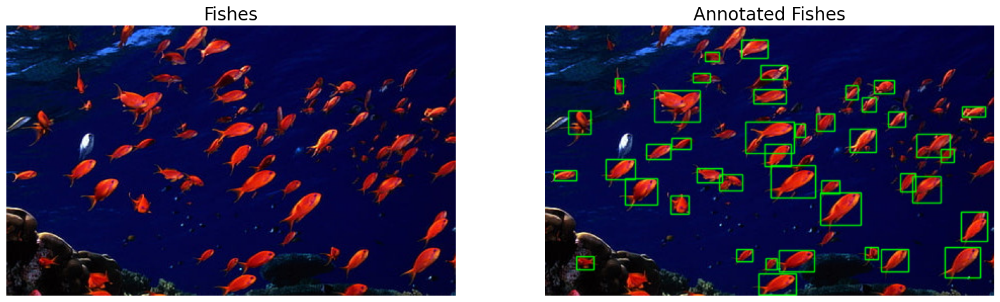

In [22]:
# Get the color mask.
mask_fishes = get_color_mask(fishes, 
                             lower=[0, 159, 100], 
                             upper=[71, 255, 255])

# Perform morphological operation, default is 'open'.
morphed_fishes = morph_op(mask_fishes, mode='open')
# Get bounding boxes.
bboxes = get_filtered_bboxes(morphed_fishes)
# Draw annotations.
ann_fishes = draw_annotations(fishes, bboxes, thickness=1)

display(fishes, ann_fishes,
        name_l='Fishes', 
        name_r='Annotated Fishes',
        figsize=(20, 14))

## Example 4: Playing with RGB Color Space
Sometime it is better to perform thresholding on individual color channels. Let's see why. 

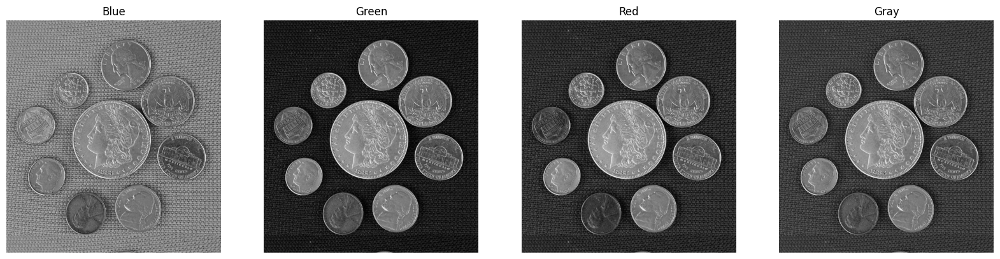

In [23]:
blue = select_colorsp(coins, colorsp='blue')
green = select_colorsp(coins, colorsp='green')
red = select_colorsp(coins, colorsp='red')
gray = select_colorsp(coins, colorsp='gray')

# Display.
plt.figure(figsize=(20,14))
plt.subplot(141); plt.imshow(blue);
plt.title('Blue'); plt.axis(False);
plt.subplot(142); plt.imshow(green);
plt.title('Green'); plt.axis(False);
plt.subplot(143); plt.imshow(red);
plt.title('Red'); plt.axis(False);
plt.subplot(144); plt.imshow(gray);
plt.title('Gray'); plt.axis(False);
        

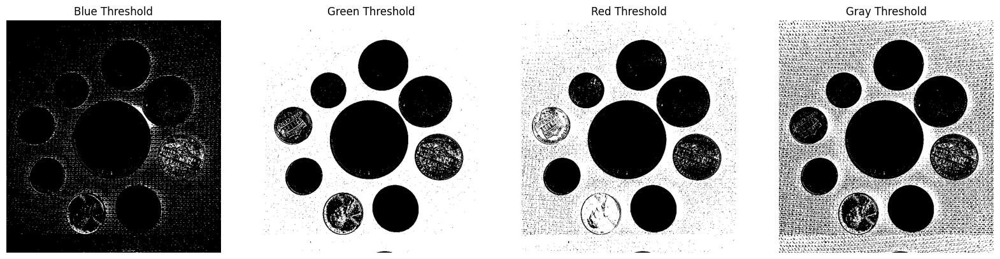

In [24]:
blue_thresh  = threshold(blue,  thresh=74)
green_thresh = threshold(green, thresh=74)
red_thresh   = threshold(red,   thresh=74)
gray_thresh  = threshold(gray,  thresh=74)

# Display.
plt.figure(figsize=(20,14))
plt.subplot(141); plt.imshow(blue_thresh);
plt.title('Blue Threshold'); plt.axis(False);
plt.subplot(142); plt.imshow(green_thresh);
plt.title('Green Threshold'); plt.axis(False);
plt.subplot(143); plt.imshow(red_thresh);
plt.title('Red Threshold'); plt.axis(False);
plt.subplot(144); plt.imshow(gray_thresh);
plt.title('Gray Threshold'); plt.axis(False);
            

It is clear that thresholding is performing much better on the **Green Channel**. 

Let's continue with the default settings for the thresholded Green Channel.

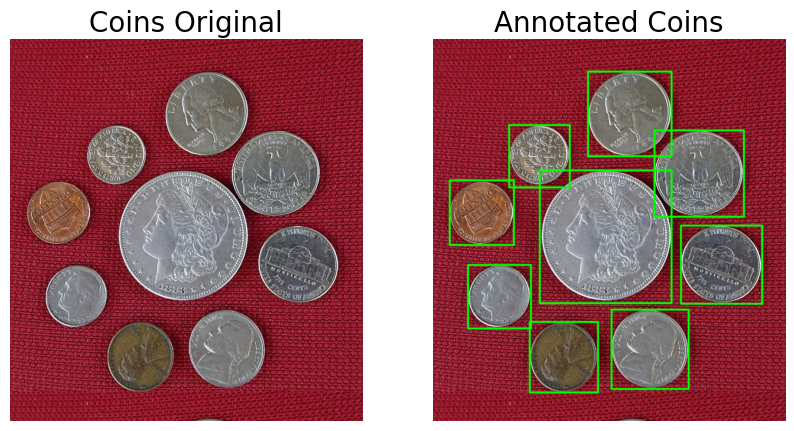

In [25]:
# Perform morphological operation.
morph_coin = morph_op(green_thresh)
# Get bounding boxes.
bboxes = get_filtered_bboxes(morph_coin)
# Draw annotations.
ann_coins = draw_annotations(coins, bboxes)

# Display.
display(coins, ann_coins, name_l='Coins Original', name_r='Annotated Coins', figsize=(10,6))

## Example 5: Playing with HSV Colorspace
Sometime, RGB colorspace might not be able to separate the required objects as we need. In that case we can experiment with other colorspaces. 

An interesting use case of **HSV colorspace** is shown in the following example.

Let's check the individual RGB channels of the box image.

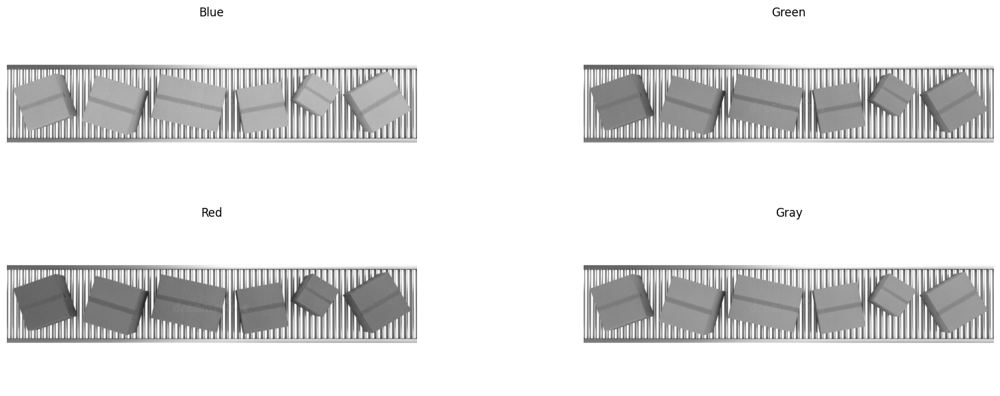

In [26]:
# RGB colorspace.
blue_boxes = select_colorsp(boxes, colorsp='blue')
green_boxes = select_colorsp(boxes, colorsp='green')
red_boxes = select_colorsp(boxes, colorsp='red')
gray_boxes = select_colorsp(boxes, colorsp='gray')

# Display.
plt.figure(figsize=(20,7))
plt.subplot(221); plt.imshow(blue_boxes);
plt.title('Blue'); plt.axis(False);
plt.subplot(222); plt.imshow(green_boxes);
plt.title('Green'); plt.axis(False);
plt.subplot(223); plt.imshow(red_boxes);
plt.title('Red'); plt.axis(False);
plt.subplot(224); plt.imshow(gray_boxes);
plt.title('Gray'); plt.axis(False);

#### Neither of R, G, B or Gray channels are contrasting. 

Let's try with **HSV Colorspace**.

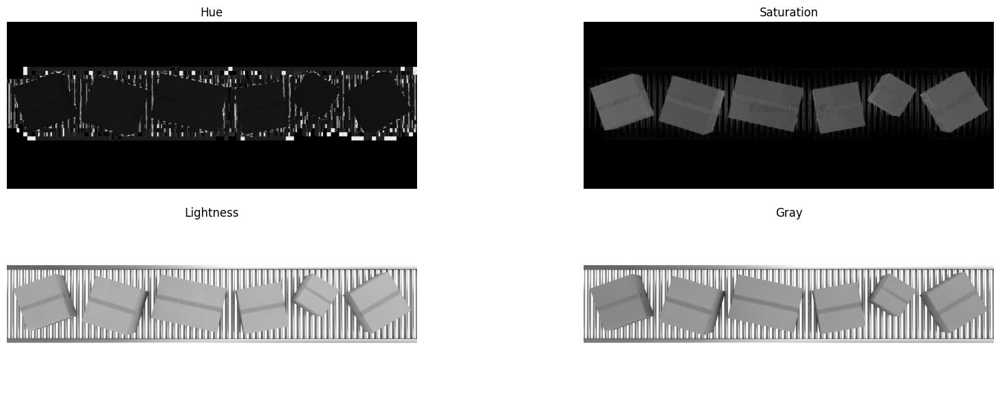

In [27]:
# HSV colorspace.
hue_boxes = select_colorsp(boxes, colorsp='hue')
sat_boxes = select_colorsp(boxes, colorsp='sat')
val_boxes = select_colorsp(boxes, colorsp='val')

# Display.
plt.figure(figsize=(20,7))
plt.subplot(221); plt.imshow(hue_boxes);
plt.title('Hue'); plt.axis(False);
plt.subplot(222); plt.imshow(sat_boxes);
plt.title('Saturation'); plt.axis(False);
plt.subplot(223); plt.imshow(val_boxes);
plt.title('Lightness'); plt.axis(False);
plt.subplot(224); plt.imshow(gray_boxes);
plt.title('Gray'); plt.axis(False);

Here it turns intersting. Clearly, saturation layer is the one that we need.

We have to play with the threshold value for a bit. I found `threshold=70` working perfectly.


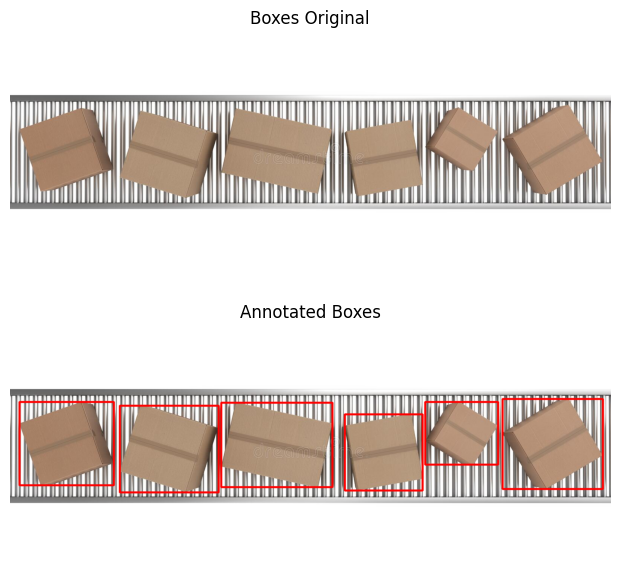

In [28]:
boxes_thresh = threshold(sat_boxes, thresh=70)
morphed_boxes = morph_op(boxes_thresh, mode='open')
bboxes = get_filtered_bboxes(morphed_boxes)
ann_boxes = draw_annotations(boxes, bboxes, thickness=4, color=(0,0,255))

plt.figure(figsize=(10, 7))
plt.subplot(211); plt.imshow(boxes[...,::-1]); 
plt.title('Boxes Original'); plt.axis(False);
plt.subplot(212); plt.imshow(ann_boxes[...,::-1]); 
plt.title('Annotated Boxes'); plt.axis(False);

## Save Annotations

In [29]:
def save_annotations(img, bboxes):
    """
    Saves annotations to a text file in YOLO format,
    class, x_centre, y_centre, width, height
    """
    img_height = img.shape[0]
    img_width = img.shape[1]
    
    with open('image.txt', 'w') as f:
        for box in boxes:
            x1, y1 = box[0], box[1]
            x2, y2 = box[2], box[3]
            
            if x1 > x2:
                x1, x2 = x2, x1
            if y1 > y2:
                y1, y2 = y2, y1
                
            width = x2 - x1
            height = y2 - y1
            
            x_centre = int(width/2)
            y_centre = int(height/2)

            norm_xc = x_centre/img_width
            norm_yc = y_centre/img_height
            norm_width = width/img_width
            norm_height = height/img_height

            yolo_annotations = ['0', ' ' + str(norm_xc), 
                                ' ' + str(norm_yc), 
                                ' ' + str(norm_width), 
                                ' ' + str(norm_height), '\n']
            
            f.writelines(yolo_annotations)